# Imports

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
%cd ..
import os, sys
sys.path.insert(0, os.path.dirname(os.path.dirname(os.path.abspath(os.getcwd()))))

/Users/Tony/Other Docs/distilling-and-forgetting-in-large-pre-trained-models


In [3]:
from IPython.display import display

from typing import Dict, List
from pathlib import Path

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns

from normalization.whisper_normalization import get_whisper_normalizer
from evaluation.string_edit_metrics import get_string_edit_metrics

sns.set_theme(context="paper", style="ticks")

OUTPUT_DIR = Path("notebooks/outputs/debug_1_best/")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

In [4]:
def get_n_words_from_series(ser: pd.Series) -> pd.Series:
    return ser.str.split().str.len()


def add_n_words_to_df(df: pd.DataFrame) -> pd.DataFrame:
    for col in df.select_dtypes(include=["object"]).columns:
        df[f"len_{col}"] = get_n_words_from_series(df[col])
    return df


def load_from_df_filepaths(df_filepaths: Dict[str, str]) -> pd.DataFrame:
    list_df = [pd.read_json(filepath)["predictions"].rename(col_name) for col_name, filepath in df_filepaths.items()]
    ref = pd.read_json(next(iter(df_filepaths.values())))["references"]
    list_df.append(ref)
    df = pd.concat(list_df, axis=1)
    return df


def get_string_edit_metrics_norm(references: List[str],
                                 predictions: List[str]) -> Dict[str, float]:
    
    norm_fn = get_whisper_normalizer("english")
    
    # Get the normalized references and predictions:
    predictions = list(map(norm_fn, predictions))
    references = list(map(norm_fn, references))
    
    return get_string_edit_metrics(references, predictions)

# Load data

In [5]:
df_filepaths = {
    "student_finetuned": "outputs/finetuning/whisper_tiny/ami_100h/checkpoint-3000-ami_test-preds_orthographic.json",
    "teacher_vanilla": "outputs/vanilla/medium/whisper-medium-ami_test-preds_orthographic.json",
    "student_1_best": "outputs/distil_1_best/whisper_medium_to_tiny/ami_100h-postprocess+filter-full/checkpoint-6000-ami-preds_orthographic.json"
}

df = load_from_df_filepaths(df_filepaths)
df["teacher_vanilla_postprocessed"] = df["teacher_vanilla"].str.strip().str.replace(r'[^\w\s\']', '')

df

/var/folders/n1/btw1cwhd13s0p6vyp4j839040000gn/T/ipykernel_26677/1431600546.py:8: FutureWarning: The default value of regex will change from True to False in a future version.
  df["teacher_vanilla_postprocessed"] = df["teacher_vanilla"].str.strip().str.replace(r'[^\w\s\']', '')


,student_finetuned,teacher_vanilla,student_1_best,references,teacher_vanilla_postprocessed
0,b,no.,thank you,yeah,no
1,mm-hmm,mm-hmm.,mmhmm,mm-hmm,mmhmm
2,yeah we were gonna meet up,"yeah, we're going to meet up.",yeah we're going to meet up,yeah we're gonna meet up,yeah we're going to meet up
3,i mean we're not even there yet,"i mean, we're not even there yet.",i mean we're not even there yet,i mean we're not even there yet,i mean we're not even there yet
4,yeah,yeah.,yeah,yeah,yeah
...,...,...,...,...,...
12638,f. a. thin buttons,15 buttons,15 buttons,fifteen buttons,15 buttons
12639,four or five between,four or five in between.,45 between,four or five between,four or five in between
12640,mm-hmm,mm-hmm.,mmhmm,mm-hmm,mmhmm
12641,um yeah maybe um uh when we uh just uh gave th...,maybe just give the numbers of,yeah maybe just if the number of,um yeah maybe um uh when we n uh just uh give ...,maybe just give the numbers of


In [19]:
df = add_n_words_to_df(df)

df["delta_words (finetuned - 1_best)"] = df["len_student_finetuned"] - df["len_student_1_best"]
df["delta_words (teacher_vanilla - 1_best)"] = df["len_teacher_vanilla"] - df["len_student_1_best"]
df["delta_words (references - finetuned)"] = df["len_references"] - df["len_student_finetuned"]
df["delta_words (references - 1_best)"] = df["len_references"] - df["len_student_1_best"]
df["delta_words (references - teacher_vanilla)"] = df["len_references"] - df["len_teacher_vanilla"]

# Get string edit metrics

## Orthographic

In [7]:
get_string_edit_metrics(references=df["references"], predictions=df["student_finetuned"])

{'wer': 0.20913166640644168,
 'sub': 0.12030200968036937,
 'del': 0.04672897196261682,
 'ins': 0.04210068476345549}

In [8]:
get_string_edit_metrics(references=df["references"], predictions=df["student_1_best"])

{'wer': 0.2815783016974104,
 'sub': 0.1340641937858274,
 'del': 0.11715700488479468,
 'ins': 0.030357103026788304}

In [9]:
get_string_edit_metrics(references=df["teacher_vanilla"], predictions=df["student_1_best"])

{'wer': 0.36901536794404494,
 'sub': 0.27829770465963943,
 'del': 0.0412028371589006,
 'ins': 0.049514826125504875}

In [10]:
get_string_edit_metrics(references=df["teacher_vanilla_postprocessed"], predictions=df["student_1_best"])

{'wer': 0.20103207054534705,
 'sub': 0.10982068082171535,
 'del': 0.041467559978324055,
 'ins': 0.04974382974530765}

In [67]:
get_string_edit_metrics(references=df["references"], predictions=df["teacher_vanilla"])

{'wer': 0.37541543059799704,
 'sub': 0.24035866437668682,
 'del': 0.11469230254500033,
 'ins': 0.02036446367630986}

In [11]:
get_string_edit_metrics(references=df["references"], predictions=df["teacher_vanilla_postprocessed"])

{'wer': 0.21570048847946824,
 'sub': 0.07981843731180158,
 'del': 0.1151718600138291,
 'ins': 0.020710191153837574}

In [12]:
get_string_edit_metrics(references=df["references"], predictions=df["student_1_best"])

{'wer': 0.2815783016974104,
 'sub': 0.1340641937858274,
 'del': 0.11715700488479468,
 'ins': 0.030357103026788304}

## Normalized

In [13]:
get_string_edit_metrics_norm(references=df["references"], predictions=df["student_finetuned"])

{'wer': 0.20594671847435297,
 'sub': 0.10457560125946272,
 'del': 0.05480002679707912,
 'ins': 0.04657109041781113}

In [14]:
get_string_edit_metrics_norm(references=df["teacher_vanilla_postprocessed"], predictions=df["student_1_best"])

{'wer': 0.19672150606556987,
 'sub': 0.09981482800370343,
 'del': 0.043883389122332216,
 'ins': 0.05302328893953422}

In [62]:
get_string_edit_metrics_norm(references=df["references"], predictions=df["teacher_vanilla"])

{'wer': 0.16618655233246243,
 'sub': 0.057446238360018755,
 'del': 0.08623076751300775,
 'ins': 0.02250954645943592}

In [31]:
get_string_edit_metrics_norm(references=df["references"], predictions=df["teacher_vanilla_postprocessed"])

{'wer': 0.16551662535450304,
 'sub': 0.05814966168687613,
 'del': 0.08783859226011032,
 'ins': 0.019528371407516582}

In [15]:
get_string_edit_metrics_norm(references=df["references"], predictions=df["student_1_best"])

{'wer': 0.23632790692481187,
 'sub': 0.11159866907840378,
 'del': 0.09133337799513186,
 'ins': 0.03339585985127621}

# EDA

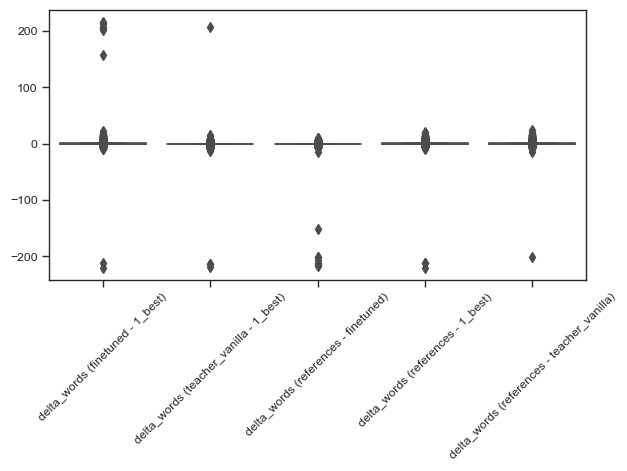

In [20]:
delta_words_cols = [col for col in df.columns if col.startswith("delta_words")]

sns.boxplot(df[delta_words_cols])
plt.xticks(rotation=45)
plt.tight_layout()

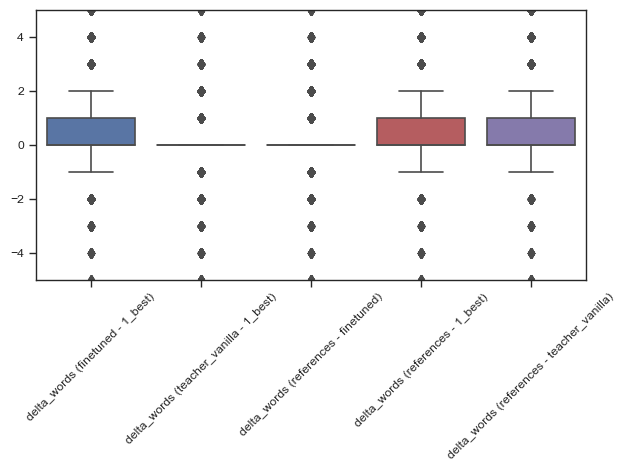

In [21]:
delta_words_cols = [col for col in df.columns if col.startswith("delta_words")]

sns.boxplot(df[delta_words_cols])
plt.xticks(rotation=45)
plt.ylim(-5, 5)
plt.tight_layout()

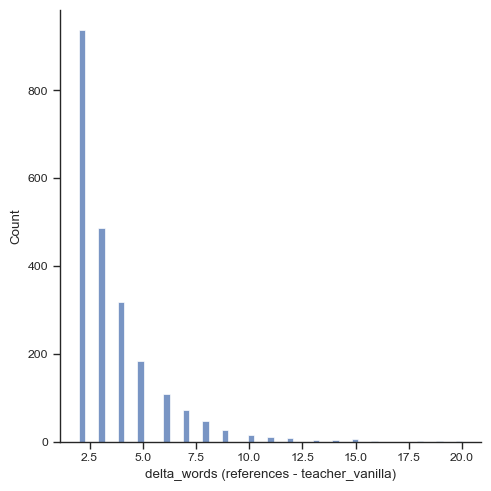

In [26]:
sns.displot(data=df[df["delta_words (references - teacher_vanilla)"].between(2, 20)], x="delta_words (references - teacher_vanilla)");

In [66]:
cols_to_show = ["references", "teacher_vanilla_postprocessed", "student_finetuned", "delta_words (references - teacher_vanilla)"]

with pd.option_context('display.max_colwidth', None):
    display(df[df["delta_words (references - teacher_vanilla)"].between(2, 20)][cols_to_show].sort_values("delta_words (references - teacher_vanilla)", ascending=False).head(20))

,references,teacher_vanilla_postprocessed,student_finetuned,delta_words (references - teacher_vanilla)
10433,so um yeah you got a general f uh f the functions of the device uh for a d. v. d. player or uh so um the pl yeah um f for uh playing uh reverse uh,so you've got the general functions of the device for a dvd player for playing reverse data,so um yeah you got uh you know for uh the functions of the device uh for a d. v. d. player uh so um the play uh yeah um for uh playing uh reverse uh t. a. t. two,20
12369,uh uh o one of uh out of s uh sev um it's uh easier to uh to do the th things that are like that on a computer,it's easier to do things like that on the computer,uh uh one of uh out of uh sef uh um it's uh easier to uh to lose uh th things uh like that on the computer uh,19
6680,you're only using it for a v incredibly short amount of time just to send the signal and then you're finished with it and you put it no no i do i don't think the the draw on it would be,and you're only using it for an incredibly short amount of time just to send a signal and then you're finished with it,you're only using it for a incredibly short amount of time just a send a signal and then you've finished with it and you put it no no no i don't i don't think the the giraffe it would be,18
192,so basically we go and go and do some work really i think that's the um the um the answer to that isn't it,so basically we go and do some work,basically we got kind of work really i think that's a the r. t. m. the r. s. to that isn't it,16
2836,w you can either have it th you could either have it you could i have it like an embedded in vector or array of strings and each one represents one person or whatever,you can either have an embedded vector or array of strings and each one represents one person or whatever,you can either have it you can either have it you can either have a like an embedded a v vector or array of strings and each one represents one person or whatever,15
10409,so um this button is for a d. v. d. or so um for every um device you've got a uh a f a b a part uh display of a part buttons,so this button is for dvd or so for every device you got a part display of buttons,so um this buttons for uh d. v. or f so um for uh f. v. um d. v. h. you got uh uh uh have a a part uh um display of uh a part buttons,15
6342,um yeah it's it charges into um some form of it's a smaller cell which it charges into and uh the si the size sort of a watch a watch battery,yeah it's a smaller cell which it charges into and the size of a watch battery,um yeah it's it charges into um some form of it's a smaller cell which it charges into and uh the side the size sort of a watch a watch battery,15
11971,we m uh we must um stay below the um below um twelve uh fifty or can't uh go um,we must stay below 1250,we m uh we missed uh stay below the uh below uh twelve uh fifty or uh you can't uh go,15
9407,i'm sorry to interrupt then but i just uh recog i just remembered that there was no that that was not um included uh that there was no room for any special features,i'm sorry to interrupt that but i just remembered that there was no room for any special features,i'm sorry to interrupt the bernachis uh rekik uh just remember that there was no that that was not um included uh that there was no room for any special features,15
10981,so uh only uh buttons uh for uh sound um for uh on off um uh shifting u up uh sa uh ca channel or uh down shifting down,so only buttons for sound for on off shifting up channel or down shifting down,so uh only uh buttons uh for uh sound um for uh on off um uh shifting up uh sent uh can in the channel or uh that shifting down,14


Seems like the teacher ignored a lot of hesitations. That shouldn't be a problem because of the normalization. Yet we still observed a 8% del error even after normalization. Let's now do the same comparison but after normalization.

In [39]:
norm_fn = get_whisper_normalizer("english")

df["references_norm"] = df["references"].apply(norm_fn)
df["teacher_vanilla_postprocessed_norm"] = df["teacher_vanilla_postprocessed"].apply(norm_fn)
df["student_finetuned_norm"] = df["student_finetuned"].apply(norm_fn)

In [34]:
df["delta_words_norm (references - teacher_vanilla)"] = get_n_words_from_series(df["references_norm"]) - get_n_words_from_series(df["teacher_vanilla_postprocessed_norm"])

In [40]:
cols_to_show = ["references_norm", "teacher_vanilla_postprocessed_norm", "student_finetuned_norm", "delta_words_norm (references - teacher_vanilla)"]

with pd.option_context('display.max_colwidth', None):
    display(df[df["delta_words_norm (references - teacher_vanilla)"].between(10, 20)][cols_to_show].sort_values("delta_words_norm (references - teacher_vanilla)", ascending=False))

,references_norm,teacher_vanilla_postprocessed_norm,student_finetuned_norm,delta_words_norm (references - teacher_vanilla)
6680,you are only using it for a v incredibly short amount of time just to send the signal and then you are finished with it and you put it no no i do i do not think the the draw on it would be,and you are only using it for an incredibly short amount of time just to send a signal and then you are finished with it,you are only using it for a incredibly short amount of time just a send a signal and then you have finished with it and you put it no no no i do not i do not think the the giraffe it would be,19
9053,and the other component we should we have in the remote controller is a resistor which is like i it is very very much important for the electricity flow through through through the remote controller and also a capacitor which is a b which is a m i think it is it is like a battery,and the other component we have in the remote controller is a resistor which is very much important for the electricity flow through the remote controller and also a capacitor which i think is like a battery,and the other component we should we have in the remote controller is a resistor which is like a a it is very very much important for the electricity flow through through the remote controller and also a capacitor which is a which is a i think it is it is like a battery,19
192,so basically we go and go and do some work really i think that is the the the answer to that is not it,so basically we go and do some work,basically we got kind of work really i think that is a the r t m the r s to that is not it,16
2836,w you can either have it th you could either have it you could i have it like an embedded in vector or array of strings and each one represents one person or whatever,you can either have an embedded vector or array of strings and each one represents one person or whatever,you can either have it you can either have it you can either have a like an embedded a v vector or array of strings and each one represents one person or whatever,15
7587,though do you do you want to do you want to sh do you want to hold it and i will i will show you the presentation,do you want to hold it and i will show you the presentation,so do you do want to do on a sh do on a hold it and i will i will show you the presentation,14
6342,yeah it is it charges into some form of it is a smaller cell which it charges into and the si the size sort of a watch a watch battery,yeah it is a smaller cell which it charges into and the size of a watch battery,yeah it is it charges into some form of it is a smaller cell which it charges into and the side the size sort of a watch a watch battery,13
2850,if someo if you want to do that then then tell me how you want the data presented how the cause do you want me to tell you,if you want to do that then tell me how you want the data presented,if some whatever you want to do that then then tell me how you want the data presented how they cause do not we tell you,13
8271,well i think i think the idea here is to to to d design one remote and what the only change is going to be the funct d t yeah the functional functional cosmetics if you want to put it that way,well i think the idea here is to design one remote and the only change is going to be the functional cosmetics if you want to put it that way,well i think i think the idea here is to it to to design one remote and what the only change is going to be the function t t t yeah functional functional cusmetics if you want to put it that way,12
9407,i am sorry to interrupt then but i just recog i just remembered that there was no that that was not included that there was no room for any special features,i am sorry to interrupt that but i just remembered that there was no room for any special features,i am sorry to interrupt the bernachis rekik just remember that there was no that that was not included that there was no room for any special features,12
6315,it is 

In [49]:
idx_to_analyze = df[df["delta_words_norm (references - teacher_vanilla)"].between(10, 20)].index.to_numpy()

idx_to_analyze

array([  192,  2414,  2836,  2850,  3208,  3549,  3944,  4318,  4658,
        5212,  5923,  6315,  6342,  6680,  6834,  7587,  8271,  8585,
        8653,  9004,  9053,  9407, 10409, 10433, 12369])

In [51]:
from evaluation.eval_dataset_name_to_dataset_group import EVAL_DATASET_NAME_TO_DATASET_GROUP
from IPython.display import Audio, display

In [44]:
dataset_name = "ami"

ds = EVAL_DATASET_NAME_TO_DATASET_GROUP[dataset_name]()["ami"]

Found cached dataset ami (/Users/Tony/.cache/huggingface/datasets/edinburghcstr___ami/ihm/0.0.0/0d128d0aa8145d0f16f3d5b4da86c5d5759dbe9e8f947fda04b25edb56442bd5)


In [50]:
ds = ds.select(idx_to_analyze)

In [53]:
for idx, x in zip(idx_to_analyze, ds):
    print(idx)
    audio = x["audio"]
    display(Audio(data=audio["array"], rate=audio["sampling_rate"]))

192


2414


2836


2850


3208


3549


3944


4318


4658


5212


5923


6315


6342


6680


6834


7587


8271


8585


8653


9004


9053


9407


10409


10433


12369


In [55]:
df["many_reps"] = df["delta_words_norm (references - teacher_vanilla)"].between(5, 50)

In [57]:
df["many_reps"].value_counts() / len(df)

False    0.97374
True     0.02626
Name: many_reps, dtype: float64

In [60]:
df_test = df[~df["many_reps"]]

get_string_edit_metrics_norm(references=df_test["references"], predictions=df_test["student_1_best"])

{'wer': 0.2281548652017696,
 'sub': 0.11346026935203969,
 'del': 0.07896023268887639,
 'ins': 0.035734363160853516}

In [61]:
get_string_edit_metrics_norm(references=df_test["references"], predictions=df_test["teacher_vanilla_postprocessed_norm"])

{'wer': 0.15121110649426833,
 'sub': 0.06028646151589959,
 'del': 0.06975777870114634,
 'ins': 0.021166866277222397}

In [ ]:
cols_to_show = ["references", "teacher_vanilla", "student_1_best", "student_finetuned", "delta_words (references - 1_best)", "delta_words (references - finetuned)"]

with pd.option_context('display.max_colwidth', None):
    display(df[df["delta_words (references - 1_best)"] > 10][cols_to_show].sort_values("delta_words (references - 1_best)"))

In [ ]:
df.columns

In [ ]:
get_string_edit_metrics(references=df["teacher_vanilla"], predictions=df["student_1_best"])

In [ ]:
cols_to_show = ["teacher_vanilla_postprocessed", "student_1_best"]

with pd.option_context('display.max_colwidth', None):
    display(df[cols_to_show].head(50))